In [1]:
import pandas as pd

                                    Andres Jaramillo - Capstone


# Automation: How to Beat the Stock Market in the Most Efficent Way Possible 

About less than a year ago I read a book called:

    Market Wizards: Interviews with Top Traders
    by Jack D. Schwager 
    
I was fascinated reading about traders who were able to become multi-millionares with only $1000 in their bank accounts, some even less. A great majority of them said they had no clue what they were doing at the start of their trading journey. 

All of them talked about the emotional stress of having to deal with market volatility, false market signals, listening to bad trading advice that leads to losses, etc... Stress impacts judgements, and emotions leads to mistakes. If I were ever to get into trading, I know that would be my downfall.

But that was before I learned about Data Science and Programming. I quickly realized I could develop my own financial model using Python and some statistical concepts. 

The book mentions Quant traders, who spend their days making and optimizing models. I most likely wont reach there success  becoming one of those wizards, but I can see myself building a model with positive returns, just maybe not like Gandalf. 

# My Testing Process Outline:


#### 1. Universe Selection

Consider the word Universe as our "market". My model will use a filter to seperate poor assets from good ones. This will also help backtest speed time, as having to feed my model information for every US stock would take too much time for quick iterations. Also, having a bucket of "good stocks" too chose from will only help our model select good investments.  

#### 2. Single Alpha Factor Modeling

A good model is only as good as the alphas that are being used to grade assets. I started small, and tested with only single alpha factors, such as ranking assets by Diluted Earnings Per Share. If I found an alpha that would replicate good returns, I would build on top of that. Backtesting single alphas is the only way to create a solid foundation and understanding of how a model works. However, you should backtest a single alpha on multiple time series (1yr, 5yrs, 10yrs). It's very common for Alphas to overfit on a specific time series if other windows of historical data is explored. 

- Use the Alphalens API to test Alpha factor preformance, which will return a Beta ( a statistic that reports how effective of a market signal is the Alpha factor)

#### 3. Alpha Combination

Combing Alphas will is necessary to maximize returns. One might think that using a bunch of Alphas together would make our model smarter, but it can actually hurt your model by using too many paramters and constraints when ranking assets. This is where you backtest the combined Alpha scores to see if there are any factors producing a high p-value, which translates to a correlation between the Alphas. You don't want alphas with a high correlation, because redudancy will hurt your financial model, use one indicator, and move onto the next, it's usually not best to combine two market signals that derive from similar relationships. I spent most of my time playing with Alphas until I got a value that I liked.  

#### 4. Risk Model

Risk control is our way of controlling the algos size of investments. Creating and balancing the Portfolio will also help with risk, but not as much as setting trading parameters and limits. For my model, I know I want something relatively low risk (Volatility ~ 20%). I wan't my algo to run without the need of constantly adjusting trading ratios due to risk. The point of making it autonomus is to not worry about decisions like a normal stock broker would. Using the same risk model for the different Alpha strategies is bad. Each uniqe finaicial algorithm should have it's own risk model considering the Alphas selected. So if my Alpha strategy changed, so would my risk model. 

#### 5. Portfolio Construction 

After formulating an Alpha combination strategy and risk model, I will combine them to produce a target portfolio and set my trade constraints, such as a MAX/MIN variable for going short and long. A key to my portfolio is how neurtal my algorithm will be in the market. Thanks too `DollarNeutral()`, my algorithm will spend the same amount of capital on long and short positions. I will also stay neutral by having my short and long positions equal the same size (%).



#### 6. Execution 

Backtest the model through Quantopians Algorithm tester. Record results, and repeat previous steps if needed. 
   

# Creating a Universe to Trade From

Below is function I created with the help of Quantopian documentation and tutorials to select my bucket of stocks. There are lots of bad US stocks that I don't want to look at, so right off the bat I shave those off by having a Minimum Market Cap, using a percintile. Then, I created another filter which actually creates a rank of the most liquid stocks avaiable given my original `market` paramenter. 

In [ ]:
def initialize(context):
    # Universe Selection
    # ------------------
    # Throw out small-cap stocks, stocks without sectors, and stocks without
    # pricing or volume data.
    market = (
        MarketCap().percentile_between(MIN_Market_Cap_Percentile, 100)
        & Sector().notnull()
        & builtin.USEquityPricing.close.latest.notnull()
        # Parens are necessary here because '&' has higher precedence than '>'.
        & (builtin.USEquityPricing.volume.latest > 0)
    )

    # From what remains, each month, take the top MarketSize stocks by average dollar
    # volume traded.
    # Setting some basic liquidity strings 
    monthly_top_volume = (
        AverageDollarVolume(window_length=LiquidityHistory)
        .top(MarketSize, mask=market)
        .downsample(Market_Data_Frequency)
    )
    # The final universe is the monthly top volume &-ed with the original base universe.
    # &-ing these is necessary because the top volume universe is calculated at the start 
    # of each month, and an asset might fall out of the base universe during that month.
    universe = monthly_top_volume & market


# Alpha Testing

Testing your alpha(s) is key to creating a good financial model. It's how I formulated my strategy before backtesting my model on historical stock data. Essentialy, the way Quantopian works, you have two enviroments to work with, Notebook and Algorithm. The notebook enviorment is your standard Jupyter Notebook IDE. Like any notebook, you can take notes, analysis and plot strategy, and call different financial API's to aid us. The second enviroment in our toolkit is Algorithm. This is the only environment on Quantopian where you can complete a backtest. 

Backtesting is not the most efficent way to test individual or multiple factors for a model (In our stock market case, these factors can also be called 'market indicators'). The indicators vary from company growth score, to anything financially stated in an income statement. This is because there are multiple inputs that go into making a good model, asset indictaros are only a slice of the model. For testing the effectiveness and non-correlations of factors in our model, it's best to seperate alpha and model backtesting.

Once you are happy with your Alpha, then you should move to backtesting on Algorithm IDE. 

Note: For my BrainStation Capstone, my Algorithm and Notebook enviroments will look completely  different 

### Alpha checker:

My strategy is the following: Create a combination of fundamentals that essentialy create a filter that identifies healthy/growth stocks and lesser ones.

This is a very simple and effective strategy that saw my most success. A trend I saw when working with my alphas was whenever I tried to overcomplicate the model by creating a rigorus filter, I woulds sometimes see higher short term gains (Not that much more, but a higher return is a higher return and intereting to note). However, a much less return in the long run. Also, they should not be correlated, keep the P-values to 0 or as little as possible. 

In [43]:
'''

 This cell is an example of my Single Alpha Tester. This function tests for different factors that can 
 optimize an algorithm model. We will be passing this function through the Alphalens API
 developed by Quantopian, which will create a tear sheet with plots and preformance data.
 From there, I can analyze how strong of an Alpha the factor is. If it's bad, I drop it and move onto the next one
 Bad means low  or negative Alpha Score.  
 

'''
# Create a pipeline of data for our function to analyis.
# We will be calling multiple API's that do the heavylifting for us. 
from quantopian.pipeline import Pipeline
from quantopian.research import run_pipeline
# Morning Star API is a DataFrame that has +600 metrics measuring the financial performance 
# of publicly traded companies. This is our "Secret Sauce". 

from quantopian.pipeline.data import builtin, morningstar as mstar
# For simplifying our testing purposes and replicating our stock "bucket" in my Algorithm. 
# I will call the Q1500US API to only have the top 1500 most liquid stocks (updated nightly).
from quantopian.pipeline.filters.morningstar import Q1500US

# make_pipeline(): is the bread and butter of Quantopian, it does most of the magic under the hood. 
# make_pipeline filters the custom stock data into my algo for selection.  
# Once you set up a pipeline, you can re-use it multiple times by changes the testing_factor variable.
def make_pipeline():
    # SELECT THE ALPHA NEEDED FOR TESTING HERE.
    vr = mstar.valuation_ratios
    # A
    testing_factor = vr.fcf_yield.latest.zscore(mask=Q1500US())
    # for testing  use 1500 most liquid US stock, and drop nulls in our data.
    universe = (Q1500US() & testing_factor.notnull())
    # Rank data by averages for to feed our model with the best score first.
    # This step is critical as Pipeline does not rank data. 
    testing_factor = testing_factor.rank(mask = universe, method = 'average')
    
    pipe = Pipeline(columns={'testing_factor' : testing_factor},
                               screen = universe)
    return pipe
'''

Run the pipeline, give it a start and end date of historical dataI liked to conduct my tests on
a short time series (1yr) and long ones (5y+) to prevent and catch overfitting on specific years.

(2015-2016 was a neutral year for the stock market, good for testing long and short strategy)

'''
result = run_pipeline(make_pipeline(), start_date='2014-12-01', end_date = '2019-01-01')

# Result is a Pandas Dataframe.
result.head()

testing_factor
2014-12-01 00:00:00+00:00 Equity(2 [ARNC])            394.0
                          Equity(24 [AAPL])          1248.5
                          Equity(41 [ARCB])          1338.5
                          Equity(62 [ABT])            964.0
                          Equity(67 [ADSK])           840.5

In [44]:
assets = result.index.levels[1].unique()
# Quantopians like to start with the last month previous to the start date above. 
pricing = get_pricing(assets, start_date='2014-12-01', end_date = '2019-01-01')
len(assets)

2211

Q1500() is a value that changes every night, so companies go in and out, hence a result higher than 1500 of possible companies to invest in.

### Alphalens:

Alphalens is a Python package for performance analysis of alpha factors. Alpha factors express a predictive relationship between given set of stock information and future returns. By applying this relationship to multiple stocks, an alpha signal is generated with the potential to trade off of it. 

Backtesting Alphas with Alphalens allowed me to quickly iterate over multiple and 'quick' ideas that bounced off my head. The great thing about Alphalens is the simplicity and quickness of the backtest, along with the tearsheet that is created, similar to `Pyfolio`.



Dropped 1.6% entries from factor data: 1.6% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,3.0,1524.0,898.549003,418.858311,736068,50.034463
2,1437.0,2998.0,2077.916663,407.576246,735054,49.965537


Returns Analysis


,3D,10D,30D
Ann. alpha,0.016,0.014,0.014
beta,-0.124,-0.107,-0.109
Mean Period Wise Return Top Quantile (bps),0.688,0.735,0.442
Mean Period Wise Return Bottom Quantile (bps),-0.684,-0.733,-0.442
Mean Period Wise Spread (bps),1.372,1.468,0.884


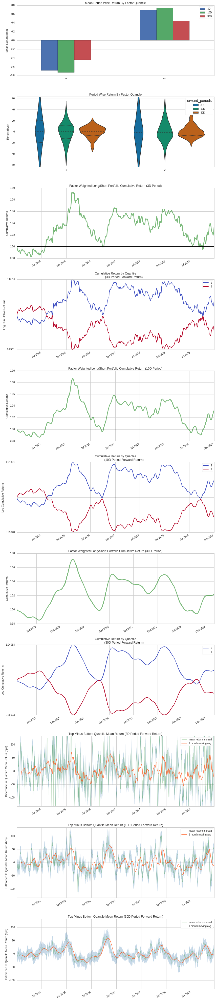

Information Analysis


,3D,10D,30D
IC Mean,0.004,0.009,0.012
IC Std.,0.122,0.118,0.113
Risk-Adjusted IC,0.034,0.076,0.108
t-stat(IC),1.076,2.416,3.406
p-value(IC),0.282,0.016,0.001
IC Skew,0.040,0.042,0.298
IC Kurtosis,-0.122,-0.125,-0.255


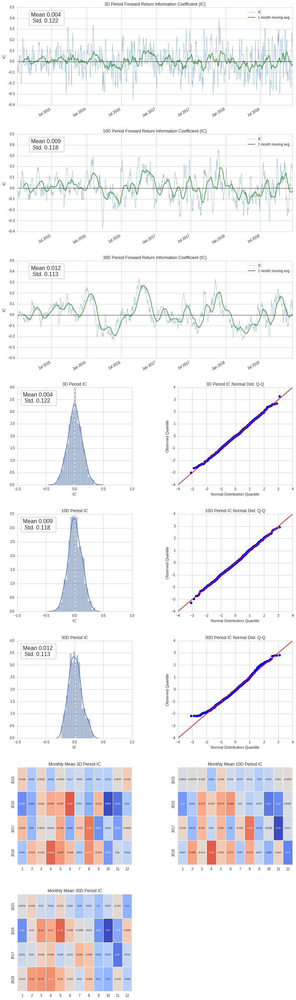

Turnover Analysis


,10D,30D,3D
Quantile 1 Mean Turnover,0.042,0.092,0.018
Quantile 2 Mean Turnover,0.038,0.082,0.017


,3D,10D,30D
Mean Factor Rank Autocorrelation,0.995,0.984,0.953


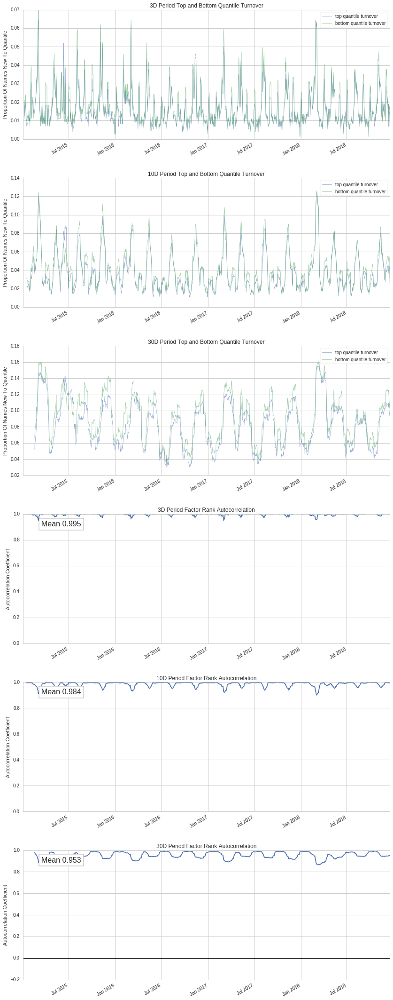

In [90]:
# run alphalens
import alphalens

factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor = result['testing_factor'],
                                        prices = pricing,
                                        quantiles = 2,
                                        # Preformance for 3 days, 10 days, 30 days averages. 
                                        periods = (3,10,30))

alphalens.tears.create_full_tear_sheet(factor_data)

# Alphas & Betas
Alot of information has been pulled thanks to the tear sheet above. This data is standard backtest for our `Alpha`, not our model. A backtest of our alphas also produce a `Beta`, which is another important indidactor when working with financial models.

`Alpha` is a measure of your returns irrespective to market gains. We want it to be high. It's good for tracking signals, not exactly strategy. 

`Beta` is a measure of your returns that are attributed to the market, we want it neutral, not negative, or too high. BUT, for our stategy, betas will not be considered in our model. You can read  why I did not incorporate my final model to filter betas here: 

https://www.investopedia.com/investing/beta-know-risk/. ("Disadvantages of Betas")

Ultimately, the numerical value of betas are very misleading for a model which conducts fundamental analysis. Nonetheless, depending on your model, they are strong indicators, just not for this one.

An `Alpha` and `Beta` target value strategy means we aim to beat the market growth rate.

# How I Found my Target Alphas

Reaching the final version of my model took over 100 backtests different backtests.

Here was how I reached there.

### Single Alpha Testing:

My first strategy was to do a simple moving average for shorting and going long, while also incorporating Sentiment Analysis.

Sentiment Analysis: (A measure of the bullishness / bearishness of the language used in media for a given stock. Ranges from -3 (extremely negative coverage) to +6 (extremely positive coverage)). In regards to my model, if a stock had a +4 score, I would go long, if -2, I would short. While also comparing moving averages. 

This strategy worked, but gave me a very weak model with small positive returns,  nothing to be proud about. I essentially dropped this strategy because I did not feel confident relying on data mining and text analysis as a strong market indicators (sentiment analysis uses text data from multiple websites, social media, news, etc...). 

I did not want my automated model to use a variable that could actually hurt it's preformance. There are many companies that might have a bad sentiment score, but can  grow overtime to be very good assets. Using sentiment scores filters out future predictions for strong assets because you aren't considering them in the first place. 


# Single Alpha Testing
Sentiment Analysis & Simple Moving Averages

To better understand how Sentiment Analysis works, I will plot Sentiment data for Apple Stock:

In [24]:
# The API below was found on Quantopian.com(https://www.quantopian.com/data/sentdex/sentiment) 
# It contains sentiments of companies by pulling from over 20 sources such as:
# Wall Street Journal, CNBC, Forbes, Business Insider, and Yahoo Finance.

from quantopian.interactive.data.sentdex import sentiment 

# Below is an example of a visually represented sentiment score for Bank of America and Apple stock.
# First lets call the sentiment API to give us the sentiment data for the stock symbol 'BAC'

# .sid stands for stock ID, it the name for a column in the Sentiment API. Each stock is given its own
# uniqe ID, for Apple stock it is 24. 

AAPL = symbols('AAPL').sid


# For reference, I watched a video done by the owner of the Sentiment API to guide (https://www.youtube.com/watch?v=eDtput89psQ)
# Which guies the view how to unload the data from the Sentiment format 
# Translating it from a blaze expression to a Pandas DataFrame. 

# This is the way you have to call sentiment data, it comes in a blaze expression. 
aapl_sentiment = sentiment[(sentiment.sid == AAPL)]
type(aapl_sentiment)

<class 'blaze.expr.expressions.Selection'>

In [25]:
type(sentiment)

<class 'blaze.expr.expressions.Field'>

In [26]:
# Transfrom from a blaze expression to a Pandas DataFrame.
'''

The Blaze Ecosystem provides Python users high-level access to efficient computation on 
inconveniently large data. I won't be using blaze, because I don't know how. So I pass the data through a 
Pandas DataFrame.
''' 
import blaze 
aapl_sentiment = blaze.compute(aapl_sentiment)

In [27]:
# We now have a DataFrame with Sentiment scores of apple.
type(aapl_sentiment)

<class 'pandas.core.frame.DataFrame'>

In [36]:
# We not have historical sentiment data for a specifc stock.  
aapl_sentiment.head()

,symbol,sentiment_signal,sid,timestamp
asof_date,,,,
2016-06-02,AAPL,-1.0,24,2016-06-03 04:00:44.994560
2016-06-03,AAPL,-3.0,24,2016-06-04 04:00:45.213705
2016-06-04,AAPL,-3.0,24,2016-06-05 03:00:46.759531
2016-06-05,AAPL,-3.0,24,2016-06-06 03:00:45.516778
2016-06-06,AAPL,-3.0,24,2016-06-07 04:00:44.666050


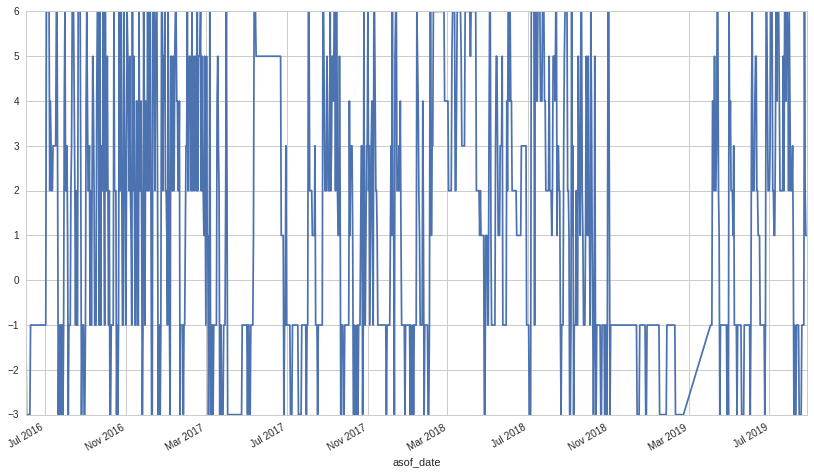

In [35]:
aapl_sentiment.set_index('asof_date', inplace=True)
aapl_sentiment = aapl_sentiment[(aapl_sentiment.index > '2016-06-01')]
aapl_sentiment['sentiment_signal'].plot()

### Comments on Sentiment Analysis Visuals

As you can see Sentiment analysis can vary alot because it is essentially a variable that's fabricated from good and bad mentions in the media. There is truth in sentiment analysis, you wouldn't want to invest in a company with a bad score because that score reflects negative public perception and poor income preformance. 

But the main reason why I did not follow through with this strategy is because you can see how sentiment scores can vary over time in a short period. Adding Sentiment analysis to my final model goes agasint its "values". There has to be 0 emotional factors in my model. I want an automated model to focus only on the necessary numerical values. "Will this asset make money in the future, and will I make a return?", I could care less what the media has to say about an asset. 

The media will put any spin they want to a story, this will not dictate quality of asset in the future. Of course, sentiment analysis is most effective for big news and large companies, but creating a filter that seperates good stocks between bad, is much more effective and accurate. Remember, this is a model that beats the stock market growth rate, so if we remove emotional signals we are already at a headstart. 

In [29]:
from quantopian.pipeline import Pipeline
from quantopian.research import run_pipeline
# The API below was found on Quantopian.com(https://www.quantopian.com/data/sentdex/sentiment) 
# It contains sentiments of companies by pulling from over 20 sources such as:
# Wall Street Journal, CNBC, Forbes, Business Insider, and Yahoo Finance.
from quantopian.pipeline.data.sentdex import sentiment 

In [38]:
# Pipelines can accelerate the time it takes to quantify large data sets. 
def make_pipeline():
    # Factors represent a result in computation and provide a numerical value in return. 
    # The numerical value will be up to date sentiment signal scores. 
    sentiment_factor = sentiment.sentiment_signal.latest
    
    universe =  (Q1500US() & sentiment_factor.notnull())
    
    pipe = Pipeline(columns= {'sentiment': sentiment_factor,
                              'longs' : (sentiment_factor >= 4),
                              'shorts' : (sentiment_factor <= -2)},
                              screen=universe
                              )

    return pipe

In [39]:
result = run_pipeline(make_pipeline(), start_date = '2015-01-01', end_date = '2019-01-01')

In [40]:
assets = result.index.levels[1].unique()
pricing = get_pricing(assets, start_date = '2014-12-01', end_date = '2019-02-01', fields = 'open_price')

Dropped 1.2% entries from factor data: 1.2% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-3.0,2.0,-1.152178,1.280258,288392,59.793413
2,1.0,6.0,3.943818,1.884231,193922,40.206587


Returns Analysis


,3D,10D,30D
Ann. alpha,0.003,0.001,0.001
beta,-0.023,-0.015,-0.036
Mean Period Wise Return Top Quantile (bps),0.549,0.381,-0.038
Mean Period Wise Return Bottom Quantile (bps),-0.520,-0.390,-0.071
Mean Period Wise Spread (bps),1.069,0.759,0.021


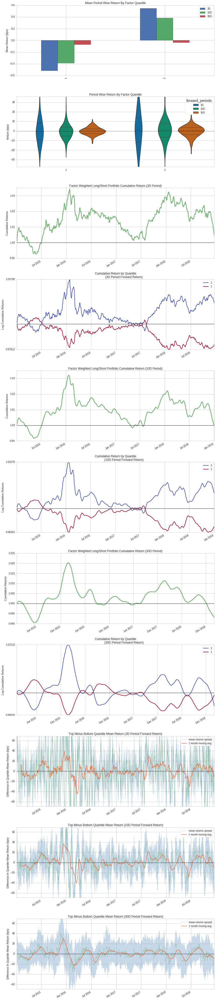

Information Analysis


,3D,10D,30D
IC Mean,0.002,0.002,0.000
IC Std.,0.057,0.055,0.054
Risk-Adjusted IC,0.035,0.028,0.004
t-stat(IC),1.119,0.891,0.137
p-value(IC),0.263,0.373,0.891
IC Skew,-0.037,0.070,0.368
IC Kurtosis,-0.056,-0.339,0.691


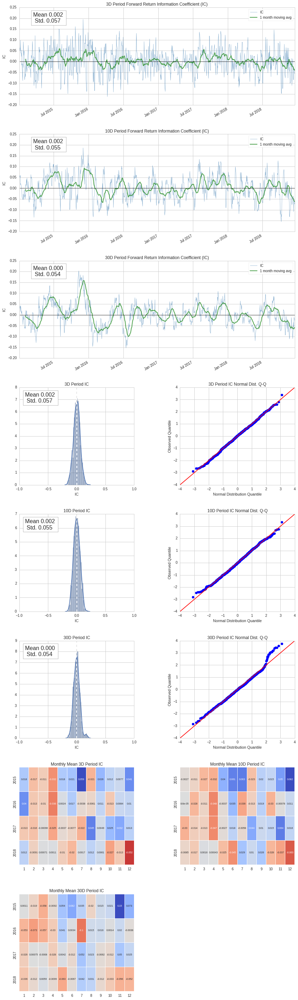

Turnover Analysis


,10D,30D,3D
Quantile 1 Mean Turnover,0.099,0.173,0.052
Quantile 2 Mean Turnover,0.145,0.249,0.077


,3D,10D,30D
Mean Factor Rank Autocorrelation,0.851,0.731,0.567


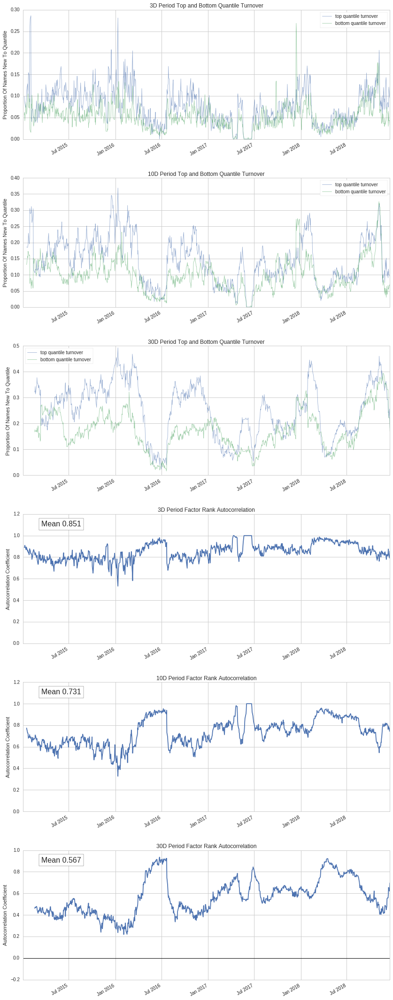

In [42]:
import alphalens 
'''


https://www.quantopian.com/posts/alphalens-a-new-tool-for-analyzing-alpha-factors
'''

# Conduct alpha scores on multipe factors to see if there is any signal in the market that we can leverage.
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor = result['sentiment'],
                                                                   prices = pricing, 
                                                                   quantiles = 2, 
                                                                   periods = (3,10,30))

alphalens.tears.create_full_tear_sheet(factor_data)  

The sentiment model above was not giving me an alpha signal worth investigating, so I moved on after multiple failures. Using the tear sheet above, I would compare my differnt results when testing multiple Alphas. 

# Multiple Alpha Combinations:
There are countless ways to make money in the stock market. I only saw much higher results when I drifted away from Sentiment Analysis as stated above. I moved on to Fundemental Analysis after I shifted my strategy to be more fitting for an autonomus algo. It should only be focused on the financial data, not emotions. 

`Morning Star` API has over 600 different types of fundementals to select from. 
https://www.quantopian.com/docs/data-reference/morningstar_fundamentals

Below was how I used a "Plug-n-play" Alpha Tester to streamline my tests without having to always build from the ground up.

In [ ]:
'''
Having an Alpha Backtester set up like this makes it easy to iterate over
different ideas and models quickly in an efficent manner. I did not want
to have a complicated model because I only wanted an algo where I understand why 
it was beating the market. It would allow me to be more comfortable with using it.

'''

def make_pipeline():
    # This is where to instantiate the factors (alphas). You can check as many as you want.
    testing_factor1 = 
    testing_factor2 = 
    testing_factor3 = 
    
    # Universe is another word for the data for the algo to work on, we want top 1500 liquid
    # US stocks without null factors. (The stock API can someone have nulls)
    universe = (Q1500US() & testing_factor1.notnull() &
               testing_factor2.notnull() & testing_factor3.notnull())
    
    # Rank each asset in the `universe` by the average of the tested alpha.
    testing_factor1 = testing_factor1.rank(mask=universe, method='average')
    testing_factor2 = testing_factor2.rank(mask=universe, method='average')
    testing_factor3 = testing_factor3.rank(mask=universe, method='average')
    
    # Combine the values to create an overall alpha combination value on an asset
    testing_factor = testing_factor1 + testing_factor2 + testing_factor3
    

    # Instantiate the pipeline of data to feed to Alphalens API  
    pipe = Pipeline(columns={
                            'testing_factor' : testing_factor},
                               screen = universe)
    
    return pipe 

# The dates are subject to play around with and explore.
result = run_pipeline(make_pipeline(), start_date = '2015-01-01', end_date = '2019-01-01')
result.head()

# Three Alpha Combinations
Below was one of my strong tests when using three Alphas, but it would only return high yields with recent data and a time window of one year. Replicating a backtest with older stock data and for a longer time period has less than favorable results compared to using only Two Alphas.
 

In [97]:
def make_pipeline():
    v = mstar.valuation
    vr = mstar.valuation_ratios
    
    # Note that I called for the latest z-scores, I explained this below in my explanation about the 
    # importance of Z-scores for my specific automated model.
    testing_factor1 = vr.fcf_yield.latest.zscore(mask=Q1500US())
    testing_factor2 = vr.earning_yield.latest.zscore(mask=Q1500US())
    testing_factor3 = v.enterprise_value.latest.zscore(mask=Q1500US())
    
    universe = (Q1500US() & testing_factor1.notnull() &
               testing_factor2.notnull() & testing_factor3.notnull())
    
    testing_factor1 = testing_factor1.rank(mask=universe, method='average')
    testing_factor2 = testing_factor2.rank(mask=universe, method='average')
    testing_factor3 = testing_factor3.rank(mask=universe, method='average')
    
    testing_factor = testing_factor1 + testing_factor2 + testing_factor3
    
    
    
    pipe = Pipeline(columns={
                            'testing_factor' : testing_factor
                            },
                                screen = universe 
                            )
    
    return pipe 

result = run_pipeline(make_pipeline(), start_date = '2015-01-01', end_date = '2019-01-01')
result.head()

testing_factor
2015-01-02 00:00:00+00:00 Equity(2 [ARNC])           1640.5
                          Equity(24 [AAPL])          3832.5
                          Equity(41 [ARCB])          2019.5
                          Equity(62 [ABT])           2809.0
                          Equity(67 [ADSK])          2225.0

In [98]:
assets = result.index.levels[1].unique()
pricing = get_pricing(assets, start_date = '2014-12-01', end_date = '2019-02-01', fields = 'open_price') 

Dropped 1.6% entries from factor data: 1.6% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,30.0,2340.0,1508.378049,578.485570,735674,50.029174
2,2164.5,4447.0,2954.046484,465.647851,734816,49.970826


Returns Analysis


,3D,10D,30D
Ann. alpha,0.021,0.018,0.018
beta,-0.200,-0.197,-0.200
Mean Period Wise Return Top Quantile (bps),0.981,0.876,0.502
Mean Period Wise Return Bottom Quantile (bps),-0.980,-0.875,-0.500
Mean Period Wise Spread (bps),1.961,1.750,1.002


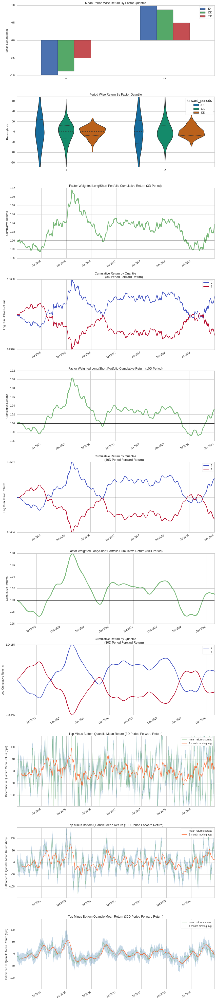

Information Analysis


,3D,10D,30D
IC Mean,0.006,0.011,0.017
IC Std.,0.125,0.118,0.115
Risk-Adjusted IC,0.050,0.097,0.145
t-stat(IC),1.564,3.066,4.565
p-value(IC),0.118,0.002,0.000
IC Skew,0.042,0.107,0.068
IC Kurtosis,-0.115,-0.190,-0.636


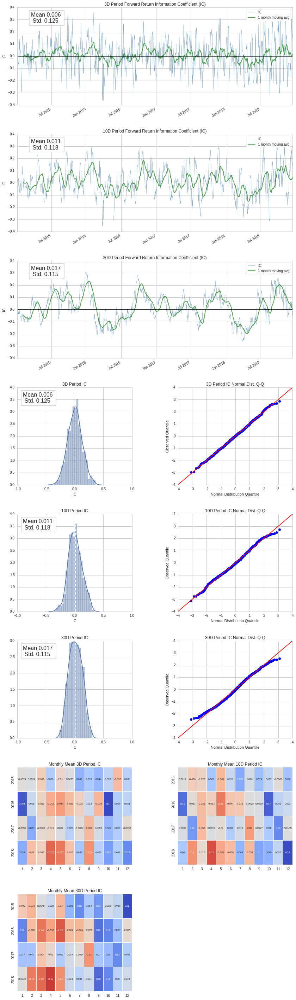

Turnover Analysis


,10D,30D,3D
Quantile 1 Mean Turnover,0.036,0.085,0.015
Quantile 2 Mean Turnover,0.028,0.063,0.012


,3D,10D,30D
Mean Factor Rank Autocorrelation,0.997,0.989,0.968


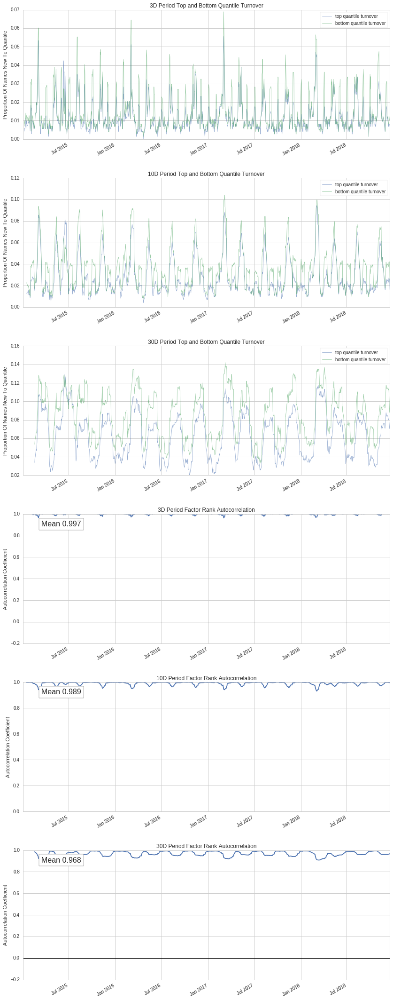

In [99]:
import alphalens 

# Conduct alpha scores on multipe factors to see if there is any signal in the market that we can leverage.
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor = result['testing_factor'],
                                                                   prices = pricing, 
                                                                   quantiles = 2, 
                                                                   periods = (30,50,150))

alphalens.tears.create_full_tear_sheet(factor_data)  

These Alpha tests do not reflect the total return of the model. A true backtest is done using the Algorithm enviroment on Quantopian. While these Alpha tests using Alphalens do provide good insight, they only provide feedback on your Alpha, without any portfolio constraints. Once I start to pick up traction on an Alpha factor worth invesiting, then I fed it into a portfolio and ran a full backtest over multiple windows of historic data. A bunch of these graphs and plots that are being produced by Alphalens API should only be taken with a grain of salt. If the graphs return positive rates and a high alpha, thats a good enough signal to transitioing the alpha test into the portfolio.

The Fundemental Analysis Variables were found in Morngingstar's Fundemental Analysis Documentation: https://www.quantopian.com/docs/data-reference/morningstar_fundamentals. I had to rely alot on Investopedia and other financial "wiki's" to understand what most of the fundamentals in the documenation were.

# Final Alphas

After many alpha tests, I selected these two because I was getting the best results, here is why they work so well:


*(fcf_yield) Free Cash Flow Yield:* 

	Free Cash Flow Yield =  Free Cash Flow per Share / Market Price per Share 


	" Free Cash Flow Yield is a way of looking at a business's cash flow to see what is available for distribution among all the securities holders of a corporate entity. The ratio is calculated by taking the free cash flow per share divided by the current share price." 
    - https://www.investopedia.com/terms/f/freecashflowyield.asp

	

*(earning_yield) Earning Yield:* 

	Diluted EPS / Price of share 


	"The earnings yield refers to the earnings per share for the most recent 12-month period divided by the current market price per share. The earnings yield (which is the inverse of the P/E ratio) shows the percentage of how much a company earned per share. This yield is used by many investment managers to determine optimal asset allocations and is used by investors to determine which assets seem underpriced or overpriced."	
    
    - https://www.investopedia.com/terms/e/earningsyield.asp

	"Diluted EPS: Diluted earnings per share, also called diluted EPS, is a profitability calculation that measures the amount of income each share will receive if all of the dilutive securities are realized. In other words, it shows the effect of dilutive securities like stock options, rights to purchase common shares, bond and preferred stock that can be converted to common shares on the basic earnings per share."
    
    - https://www.myaccountingcourse.com/accounting-dictionary/diluted-earnings-per-share



    
*FINAL STRATEGY: EVALUATING THE HEALTH OF THE STOCK AND COMPANY BY COMBINING THE FOLLOWING:*
    
- Free Cash Flow Yield & Earning Yield - Latest Data.
- Get latest Z-scores for each asset. (We want to know the numerical relational value between the AVG quality of the stock over a time series, higher the z-score, the better the stock) This is explained below.
- Combine them to create an Alpha (Alpha Combination).
- Rank the assets by Alpha Combination.

We only want to buy assets that have high yields in FCF and EY. This allows our model to purchase quality stocks that can payout dividens due to operational preformance ($). These stock  tend to preform well in the stock market due too attractiveness and a good company income statement that says they have enough money to pay dividends. 


# Z-scores & "Pair Trading"

One of the reasons those Alphas preformed well, apart from being a good signal, was because I would use the Z-scores of `Free Cash Flow Yield` and `Earning Yield`. To my understanding, a Z-score is a great indicator when having a short and long strategy. A z-score is able to identify how far away a value is away from the mean. 

Relating this to a stock, a z-score can explain if the value of a stock is going down from the total AVG, or up. High z-scores indicate a stock growing in value, a low or negative z-score signals indicate a stagnate stock or one decreasing in value.

      fcf_yield = `vr.fcf_yield.latest.zscore(mask=Q1500US())`
      fcf_yield = fcf_yield.rank(mask=universe, method='average')
        
Disecting the code above taken from the previous Alpha test, you can see I call for the .zscore  for `Free Cash Flow Yield` and then rank the score given to assets from the Q1500US Universe. The data it produces essentialy reflects a stocks growth, and if you take that data and give it a time series window, that produces an even better indicator for growing stocks. 

The key thing about Z-scores, is being able to identify growth stocks that are much higher than their mean. A very high Z-score, shows a very good stock thanks to explaining relationships with the avg historical data.

I read more about Z-scores in Finance on: https://www.investopedia.com/articles/fundamental/04/021104.asp
 
Quantopian has over 50 guides to help new users like myself explore advanced finacial strategies. I got the idea of using Z-scores after reading 'Introduction to Pairs Trading', in lecture 44. Pairs Trading is essentially the strategy my model is following. I stubmled upon this strategy by accident, only to realize it follows 

1. https://www.quantopian.com/lectures#Integration,-Cointegration,-and-Stationarity
2. https://www.quantopian.com/lectures/introduction-to-pairs-trading

In [100]:
def make_pipeline():
    v = mstar.valuation
    vr = mstar.valuation_ratios
    
    testing_factor1 = vr.fcf_yield.latest.zscore(mask=Q1500US())
    testing_factor2 = vr.earning_yield.latest.zscore(mask=Q1500US()) 
    
    
    universe = (Q1500US() & testing_factor1.notnull() &
               testing_factor2.notnull())
    
    testing_factor1 = testing_factor1.rank(mask=universe, method='average')
    testing_factor2 = testing_factor2.rank(mask=universe, method='average')
    
    testing_factor = testing_factor1 + testing_factor2 
    
    
    pipe = Pipeline(columns={
                            'testing_factor' : testing_factor},
                             screen = universe)
    
    return pipe 

result = run_pipeline(make_pipeline(), start_date = '2015-01-01', end_date = '2019-01-01')
result.head()

testing_factor
2015-01-02 00:00:00+00:00 Equity(2 [ARNC])            437.5
                          Equity(24 [AAPL])          2395.5
                          Equity(41 [ARCB])          1942.5
                          Equity(62 [ABT])           1443.0
                          Equity(67 [ADSK])          1192.0

In [101]:
assets = result.index.levels[1].unique()
pricing = get_pricing(assets, start_date = '2014-12-01', end_date = '2019-02-01', fields = 'open_price') 

Dropped 15.6% entries from factor data: 15.6% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,3.0,1531.0,901.646364,420.466368,630970,50.033265
2,1444.5,2998.0,2081.618023,405.368749,630131,49.966735


Returns Analysis


,30D,50D,150D
Ann. alpha,0.016,0.020,0.023
beta,-0.105,-0.139,-0.178
Mean Period Wise Return Top Quantile (bps),5.909,5.011,4.552
Mean Period Wise Return Bottom Quantile (bps),-5.900,-5.007,-4.553
Mean Period Wise Spread (bps),11.809,10.020,9.107


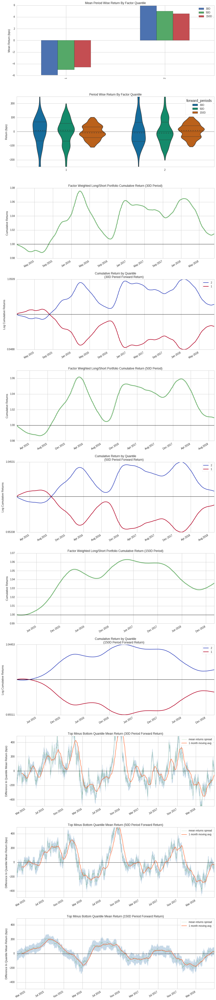

Information Analysis


,30D,50D,150D
IC Mean,0.011,0.014,0.041
IC Std.,0.115,0.123,0.106
Risk-Adjusted IC,0.093,0.116,0.384
t-stat(IC),2.752,3.436,11.374
p-value(IC),0.006,0.001,0.000
IC Skew,0.376,0.267,0.068
IC Kurtosis,-0.147,-0.202,-0.825


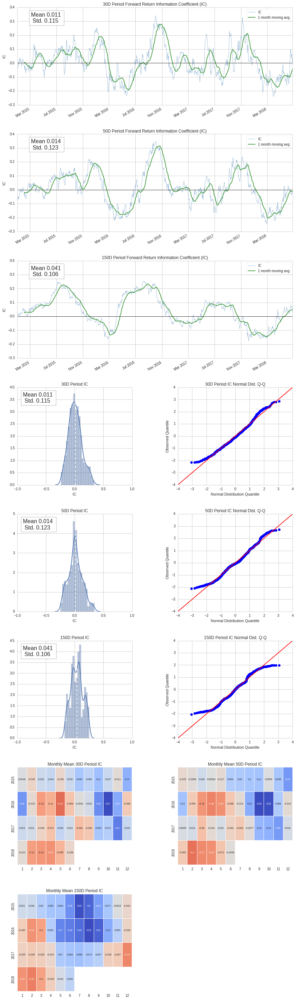

Turnover Analysis


,150D,30D,50D
Quantile 1 Mean Turnover,0.257,0.092,0.131
Quantile 2 Mean Turnover,0.224,0.083,0.116


,30D,50D,150D
Mean Factor Rank Autocorrelation,0.952,0.923,0.799


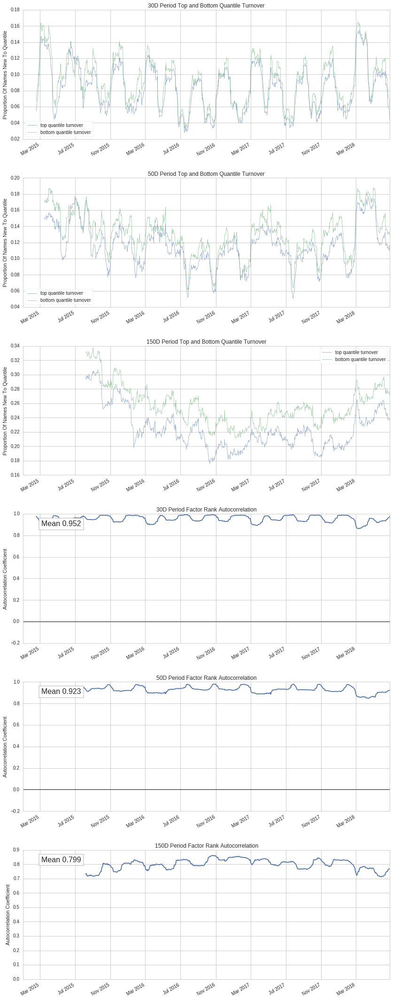

In [103]:
import alphalens 


# Conduct alpha scores on multipe factors to see if there is any signal in the market that we can leverage.
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor = result['testing_factor'],
                                                                   prices = pricing, 
                                                                   quantiles = 2, 
                                                                   periods = (30,50,150))

alphalens.tears.create_full_tear_sheet(factor_data)  

# Risk Model & Portfolio Construction
My model incorporates an API called Optimization, whichs helps balances portfolios for Quantopian users. I would rely on the following links below to help me build the portfolio and understand the code needed to do so.

1. https://www.quantopian.com/help (Portfolio Optimization)
2. https://www.quantopian.com/help#constraints-api-docs

The Optimize API allows does alot of the computation work for us, we only need to feed it a certain parameters. The more you feed it, the stricter your portfolio will be. For many of my strategies, I changed and played with many of the numerical factors. 

Below is an example of my most successful portfolio:

In [1]:

# Constraint Parameters (TRADE CONTROL) 

MAX_Gross_Leverage =   

MAX_Short_Position_Size =
MAX_Long_Position_Size = 



# Most of my functions in Algorithm have context and data as arguments. These functions are running 
# 'under the hood' on Quantopian. These essentially connect the flow of data and multiple arguments together,
# Which is why Quantopian is highly regarded as a great tool for creating models due to the simplicity
# for the user.

def do_portfolio_construction(context, data):
    # Instantiate pipeline of daily data to your portfolio
    pipeline_data = context.pipeline_data
    # In my complete algorithm, todays_universe represents my asset quality filter for daily data.
    todays_universe = pipeline_data.index
    # Set an index 

 # I simply use our ranks as an alpha coefficient, while maximizing that Alpha via
 # Quantopians Optimization API. My objective is toallocate the maximum amount of long/short
 # capital to assets with high/low ranks.

 # opt. is calling the optimization API,
    objective = opt.MaximizeAlpha(pipeline_data.alpha)

    
 # Constraining the gross leverage is an important step  that the value of my long and shorts positions 
 # don't exceed my portfolio values. This will help me reduce risk and stop my algorithm from doing
 # large risky trades.

 # MAX_Gross_Leverage is my variable which holds the numerical parameter. 
    constrain_gross_leverage = opt.MaxGrossLeverage(MAX_Gross_Leverage)
    
 # Constrain individual position size to not more than the fixed percentage 
 # of my models portfolio. This model hits this maxium for almost every invesetment. 

    constrain_pos_size = opt.PositionConcentration.with_equal_bounds(
        -MAX_Short_Position_Size,
        MAX_Long_Position_Size,
    )

 # Constrain the model to allocate an equal amount of capital for shorts and longs.
    market_neutral = opt.DollarNeutral()
    
 # Constrain ourselve to have a net leverage of 0.0 in each sector.
 # This is a critical aspect for my model, without having a low and equal leverage for 
 # sectors/industries, then my model will be severely impacted by low preforming industries 
 # in the future and during backtesting. 

    
    sector_neutral = opt.NetPartitionExposure.with_equal_bounds(
        labels=pipeline_data.sector,
        min= ,
        max= ,
    )

 # Run the optimization. This will calculate new portfolio weights and
 # manage moving the portfolio toward the target objective.
 # we feed our objective and constraints into the algo, followed by selecting the universe.
    algo.order_optimal_portfolio(
        objective=objective,
        constraints=[
            
            '''
            NOTE: The variables for constraints aren't present in this doucment
            '''    
            
        ],
        universe=todays_universe,
    )
    
# Alot of these numerical values where changed and tested with different combinations of alphas. 
# My goal was to create a pretty plug and play portfolio that would allow me to iterate through
# different ideas. 

# Creating a Pipeline
Scheduling the flow of data running into my algorthim.

Financial aglorithms need pipelines of data running through them everyday to calculate target portfolios, assets and investmets. Depending on the model being used, an API will fetch the last X days’ worth of data for a large number of assets and apply a reduction function to produce a single value per asset (For my most successful pipeline, I ranked the assets and used the alpha combination as the single value). This kind of calculation is known as cross-sectional trailing-window computation.
 

Every day, fetch the last two days of close prices for all assets. For each asset, calculate the percent change between the asset’s previous close price and its current close price.
The purpose of the Pipeline API is to make it easy to define and execute cross-sectional trailing-window computations.

Resources used to help build my pipelines:
1. https://www.quantopian.com/help#pipeline-title
2. https://www.quantopian.com/tutorials/pipeline#lesson2
3. https://www.quantopian.com/help (scheduling functions)

In [ ]:
# Instantiate the pipeline of data by calling Pipeline(), and creating a dataframe. My ranking system 
# takes the combined alpha and sector as variables for rank consideration. Naturally, my model will
# invest in any sector, with an even spread.
pipe = Pipeline(
        columns={
            'alpha': combined_alpha,
            'sector': Sector(),
        },
 # combined_alpha will be NaN for all stocks not in our universe,
 # but we also want to make sure that we have a sector code for everything
 # we trade.
        screen=combined_alpha.notnull() & Sector().notnull(),
    )
    algo.attach_pipeline(pipe, 'pipe')

 # Schedule a function, 'do_portfolio_construction', to run once a week
 # ten minutes after market open.
 # Minutes_After_Market_Open is one of my pipeline control variables. Other financial algorithms 
 # used a 10 minute buffer time after the market open. My understanding is the lag between new market data
 # connecting through the Pipeline API. 
    algo.schedule_function(
        do_portfolio_construction,
        date_rule=algo.date_rules.week_start(),
        time_rule=algo.time_rules.market_open(minutes=Minutes_After_Market_Open),
        half_days=False, # 
    )


# Create a function to prepare the model to work on. Context and Data arguments are standard for this function
# and are needed in order to make the pipeline work. This function below will call my pipeline at the a 
    def before_trading_start(context, data):
        # Call pipeline_output in before_trading_start so that pipeline
        # computations happen in the 5 minute timeout of BTS instead of the 1
        # minute timeout of handle_data/scheduled functions.
        context.pipeline_data = algo.pipeline_output('pipe')

# Backtesting My Models

Quantopians Algorithm enviroment is where I conducted my backtest that involved every aspsect of my algorithm. I had the freedom to test on multiple historic time windows and the amount of capital to start out investing. 

The Backtest produces a similar tear sheat to the one above. 

Key values I looked at was my Alpha score, how volatile my model is, and Sharpe Ratio. The alpha shows indicates how much return your model created irrespective to the market growth rate. A high Alpha scores shows how much you're beating the market by. Volatility is a strong indicator how risky the model is. A high volatility means the model experinces a high drawdown ratio. Not optimal, but in  most cases a model with high returns will also see an increase in volatility. Sharpe ratio is used to help investors understand the return of an investment compared to its risk. The ratio is the average return earned in excess of the risk-free rate per unit of volatility or total risk. This measurement provides good insight in the rate of return compared to risk. 

Because I want my model to preform well for every year as its neutral due to having an equal amount of short and long positions. I would test on historic data ranging from max 10 years ago, specifically after the 2008 economic crisis. 

A popular trend I noticed was that if my model struggled building a strong portfolio at the start of its inception (0-1yr), then it would see poor return rate over the course of the next quarters. However, overtime the algo adjusts while creating a positive return trend. Specific years that my most succesful models tested poorly at launch were between 2010-2011 and 2015-2017.  

I used this reference and the Quantopian documentation to help me understand more about the backtesting enviroment: 
1. https://www.quantopian.com/posts/improved-backtest-analysis

### My Model Tested with 9 Years of Historic Data :
I tested my model starting two years post the market crash in 2008. Reason being I wanted to see how it would preform in multiple market phases: bullish and bearish, selloffs, and scares, etc... Testing the longetivity of the algo was critical to reach my success. 

Key Statistics that explain my model: 

`Annual Returns = 21%` : An annual return rate of 21% is acceptable for a model that is beating the market rate.

`Cumulative Returns = 453.1% ` : A total return of 453% over a period of 8 years is okay. My model suffered a huge loss in returns between 2015-2016, and it still did not recover, but overtime it looks like it will and exceed it's highest return rate. 

`Annual Volatility = 20.4%` : A 20% volatility rate is accepetable, volatility is needed to make great returns, so it can also be seen as an opportunity. But generally, a quant algo needs to either have a low volaility rate, or manage it on a rolling basis. 

`Sharpe Ratio = 1.03` : Anything over a 1.00 Sharpe ratio is considered acceptable, but still shows how vulenerable you are to market volatility.  

`Max Drawdown = -56.2%` :  This happened between 2015-2016, A major reason is due to the sell off in 2015-2016. The stock market had a huge decline in stock price. My Alpha combinations are based on fundamental analysis, which stock price is directly correlated with, which is why my model felt the momentum. 
https://en.wikipedia.org/wiki/2015–16_stock_market_selloff#Stock_market_performance_on_January_20,_2016
    
    
`Alpha = 0.25` : This model is beating the market by 25% of its total growth.


100% Time:  0:00:05|##########################################################|


Start date,2010-08-31
End date,2019-08-29
Total months,107
,Backtest
Annual return,21.0%
Cumulative returns,453.1%
Annual volatility,20.4%
Sharpe ratio,1.03
Calmar ratio,0.37
Stability,0.77
Max drawdown,-56.2%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,56.22,2016-01-19,2016-10-03,NaT,NaN
1,16.39,2013-04-24,2013-09-18,2014-04-28,264
2,15.29,2012-11-15,2013-01-07,2013-02-04,58
3,12.67,2014-12-15,2015-02-05,2015-07-24,160
4,10.59,2014-05-09,2014-07-11,2014-09-09,88


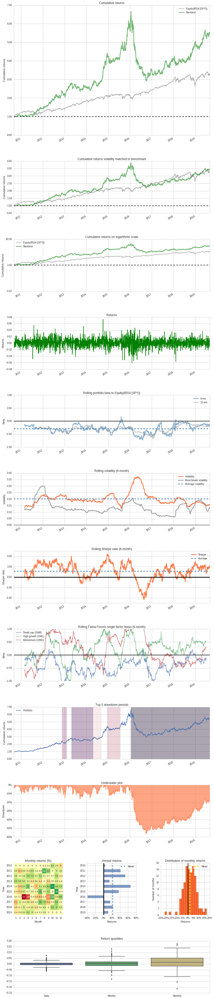

/usr/local/lib/python2.7/dist-packages/numpy/lib/function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


Stress Events,mean,min,max
US downgrade/European Debt Crisis,0.27%,-1.20%,2.77%
Fukushima,-0.11%,-2.01%,2.35%
EZB IR Event,-0.01%,-2.55%,2.63%
Apr14,0.36%,-2.70%,2.88%
Oct14,0.71%,-1.87%,7.33%
Fall2015,0.14%,-5.22%,2.78%
Recovery,0.14%,-4.88%,5.50%
New Normal,0.06%,-6.21%,7.33%


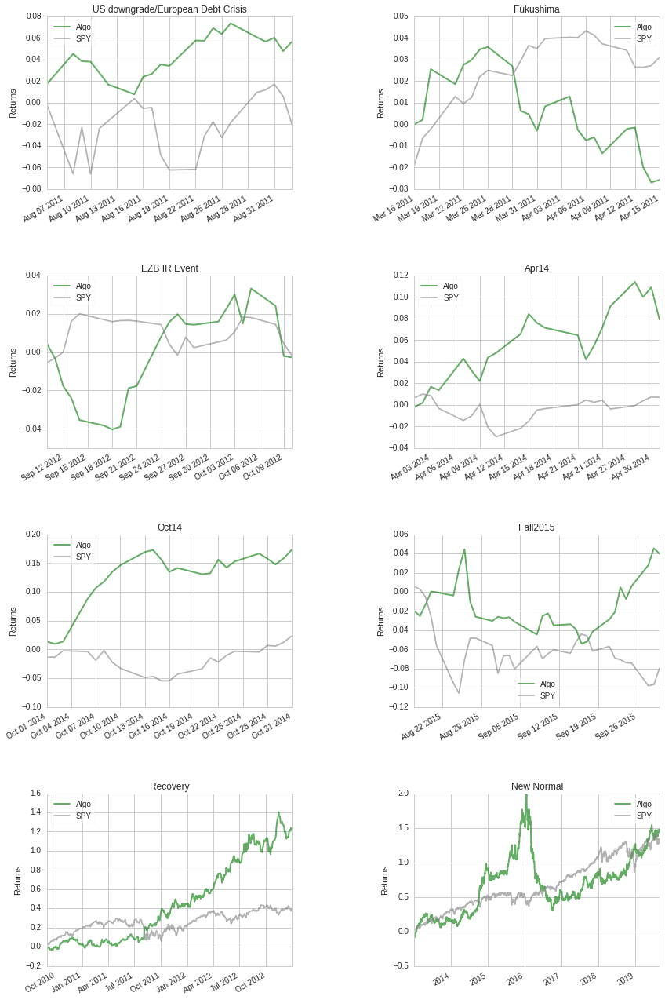

Top 10 long positions of all time,max
NE-5249,11.84%
RIG-9038,10.94%
NRG-26143,9.04%
FSLR-32902,8.86%
AAPL-24,8.81%
DNR-15789,8.61%
CF-27558,8.59%
RIO-6584,8.48%
CSIQ-32856,8.35%
WDC-8132,8.34%


Top 10 short positions of all time,max
SRPT-16999,-15.46%
CHK-8461,-14.11%
VALE-23536,-11.45%
HK-26487,-10.96%
SNAP-50683,-10.45%
ECA-23021,-10.43%
SUNE-13306,-10.22%
BBD-26126,-10.14%
SCTY-43721,-10.05%
JUNO-48317,-9.78%


Top 10 positions of all time,max
SRPT-16999,15.46%
CHK-8461,14.11%
NE-5249,11.84%
VALE-23536,11.45%
HK-26487,10.96%
RIG-9038,10.94%
SNAP-50683,10.45%
ECA-23021,10.43%
SUNE-13306,10.22%
BBD-26126,10.14%


All positions ever held,max
SRPT-16999,15.46%
CHK-8461,14.11%
NE-5249,11.84%
VALE-23536,11.45%
HK-26487,10.96%
RIG-9038,10.94%
SNAP-50683,10.45%
ECA-23021,10.43%
SUNE-13306,10.22%
BBD-26126,10.14%


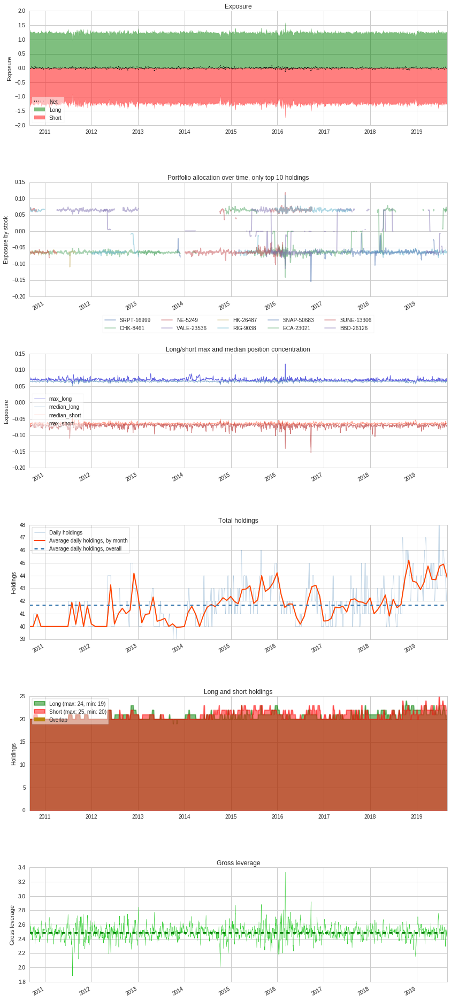

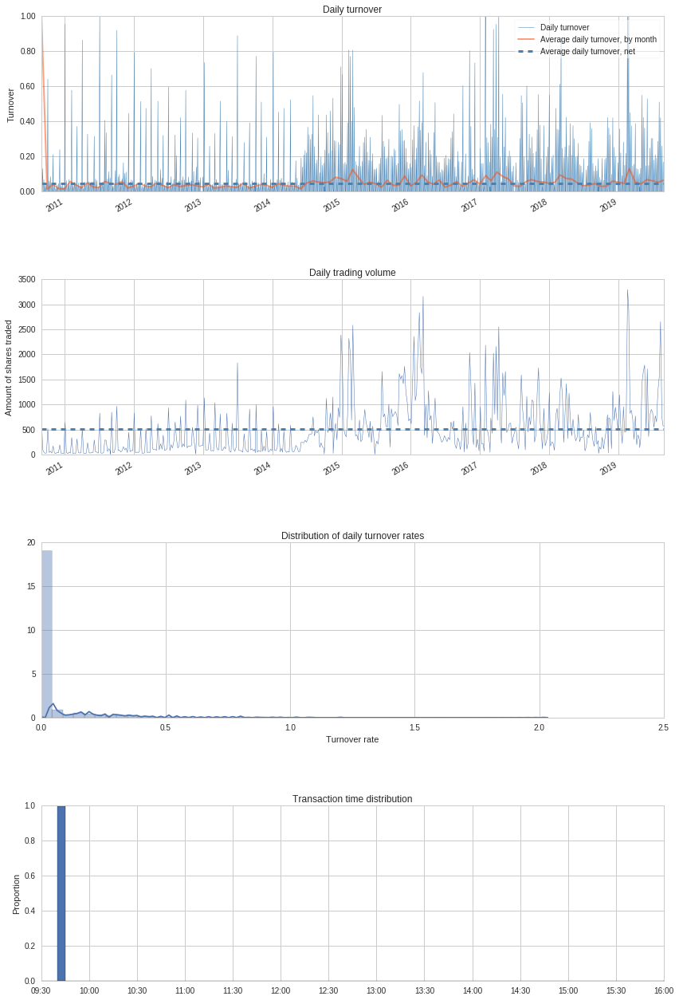

/usr/local/lib/python2.7/dist-packages/pyfolio/perf_attrib.py:559: UserWarning: Could not determine risk exposures for some of this algorithm's positions. Returns from the missing assets will not be properly accounted for in performance attribution.

 47 assets were missing factor loadings, including: AAMRQ-389, ALU-273, AMRN-21036, AMX-22416, ASML-12626..YY-43647. Ignoring for exposure calculation and performance attribution. Ratio of assets missing: 0.106. Average allocation of selected missing assets:

AAMRQ-389     -337.285966
ALU-273       -356.060206
AMRN-21036    -337.690292
AMX-22416      535.395909
ASML-12626     366.037332
YY-43647      1370.064000
dtype: float64.

  warnings.warn(missing_stocks_warning_msg)


## Performance Relative to Common Risk Factors

Summary Statistics,
Annualized Specific Return,15.59%
Annualized Common Return,4.73%
Annualized Total Return,20.88%
Specific Sharpe Ratio,0.89


Exposures Summary,Average Risk Factor Exposure,Annualized Return,Cumulative Return
basic_materials,-0.02,-0.27%,-2.42%
consumer_cyclical,-0.01,-0.61%,-5.34%
financial_services,0.02,0.59%,5.43%
real_estate,-0.01,-0.08%,-0.68%
consumer_defensive,-0.01,-0.18%,-1.57%
health_care,-0.03,-0.58%,-5.08%
utilities,0.00,0.05%,0.42%
communication_services,-0.01,-0.11%,-1.00%
energy,-0.13,-1.71%,-14.33%
industrials,-0.01,-0.20%,-1.75%


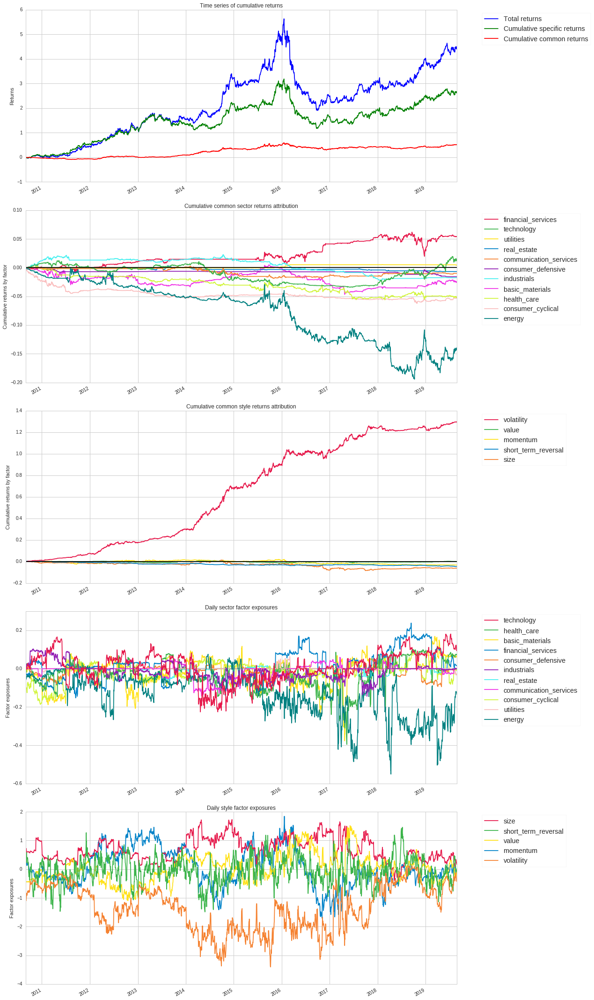

In [1]:
bt = get_backtest('5d6a98a3a763d15f09cf71cf')
bt.create_full_tear_sheet()

### Visual Analysis

Overall, a promising model that will be interesting to test live with daily stock market data. A couple of future change down the road, would be to create two submodels into my algo. When the market is bullish and bearish, my portfolio weights and shorts/longs will adjust according to the market. 

I have been working on trying to get my algo to stop trading energy returns, or atleast research on what resources its investing in the sector. 



# Final Notes

A final note on which parameters gave me most success: 

Playing around with my `MAX_Short_Position_Size` and `MAX_Long_Position_Size` saw model return rates either spiking up or stagnating. A higher size will show a more volatile graph during backtesting, but with chances of high returns. Having a low size will reduce your investing efficency. 

`MAX_Gross_Leverage` was either tested with 1.0 or 2.0 as a value. 2.0 saw the most success, which also increased the volatilty of my model. 

`MarketSize` Also played a role, surprsingly the amount of stocks my algo could choose from was a factor that played with the amount of returns I would receive. 500 seemed to be the sweet spot.

Nonetheless, my Alpha combination generated most of the success as it ranked the assets in my Universe. 

If I were to turn "On' my model and start investing with stocks, I would need to migrate my algo onto QuantConnect. Quantopian is only a backtesting platform where users are given tools to play around with algos.

# Best Model for Long Term Investment

Below is a backtest of my best model that is ran on 9 year historic data. It is very successful it terms of completing my algo goals (high rate or return beating the market, and steady growth). The first thing someone might comment is that this is overfitting. Yes that is correct, my model is overfitting the historic data as it preforms very well. But, even when testing it when recent data and new stock market prices everyday, the model preforms well with positive returns.  

100% Time:  0:00:10|##########################################################|


Start date,2010-01-07
End date,2019-08-30
Total months,115
,Backtest
Annual return,26.0%
Cumulative returns,824.5%
Annual volatility,23.6%
Sharpe ratio,1.10
Calmar ratio,0.42
Stability,0.83
Max drawdown,-61.7%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,61.71,2016-01-19,2017-05-18,NaT,NaN
1,15.22,2012-08-03,2012-10-18,2012-11-12,72
2,15.06,2010-11-26,2011-01-10,2011-08-04,180
3,14.16,2015-12-08,2016-01-05,2016-01-12,26
4,12.85,2012-11-15,2012-12-13,2013-01-24,51


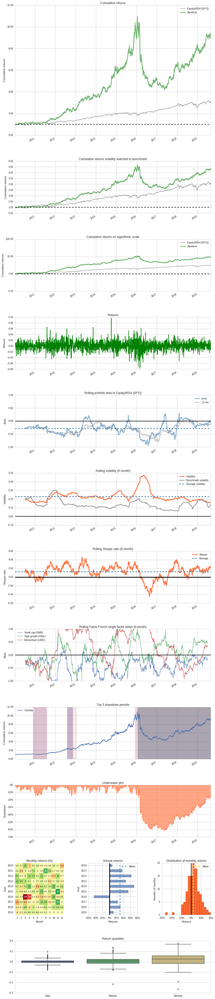

/usr/local/lib/python2.7/dist-packages/numpy/lib/function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


Stress Events,mean,min,max
US downgrade/European Debt Crisis,0.47%,-2.55%,3.62%
Fukushima,-0.09%,-2.06%,2.47%
EZB IR Event,-0.05%,-3.32%,2.67%
Flash Crash,0.46%,-0.96%,2.04%
Apr14,0.49%,-2.27%,3.75%
Oct14,0.57%,-2.17%,9.66%
Fall2015,0.04%,-5.24%,3.30%
Recovery,0.13%,-4.54%,6.55%
New Normal,0.09%,-7.73%,9.66%


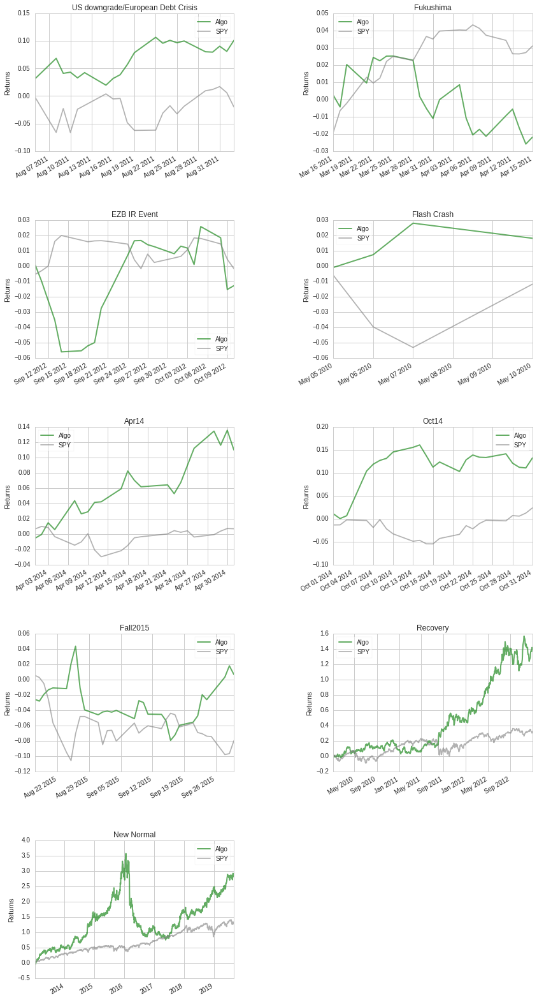

Top 10 long positions of all time,max
NE-5249,17.20%
RIG-9038,15.83%
NRG-26143,13.19%
F-2673,11.70%
PRU-23328,11.61%
FSLR-32902,11.56%
MPC-41636,11.49%
GM-40430,11.46%
VLO-7990,11.41%
THC-5343,11.41%


Top 10 short positions of all time,max
CHK-8461,-20.48%
WLL-25707,-19.57%
ECA-23021,-15.14%
BBD-26126,-14.71%
SWN-7244,-13.97%
FCX-13197,-13.70%
SUNE-13306,-13.66%
SNAP-50683,-13.63%
HRI-32887,-13.31%
SCTY-43721,-13.20%


Top 10 positions of all time,max
CHK-8461,20.48%
WLL-25707,19.57%
NE-5249,17.20%
RIG-9038,15.83%
ECA-23021,15.14%
BBD-26126,14.71%
SWN-7244,13.97%
FCX-13197,13.70%
SUNE-13306,13.66%
SNAP-50683,13.63%


All positions ever held,max
CHK-8461,20.48%
WLL-25707,19.57%
NE-5249,17.20%
RIG-9038,15.83%
ECA-23021,15.14%
BBD-26126,14.71%
SWN-7244,13.97%
FCX-13197,13.70%
SUNE-13306,13.66%
SNAP-50683,13.63%


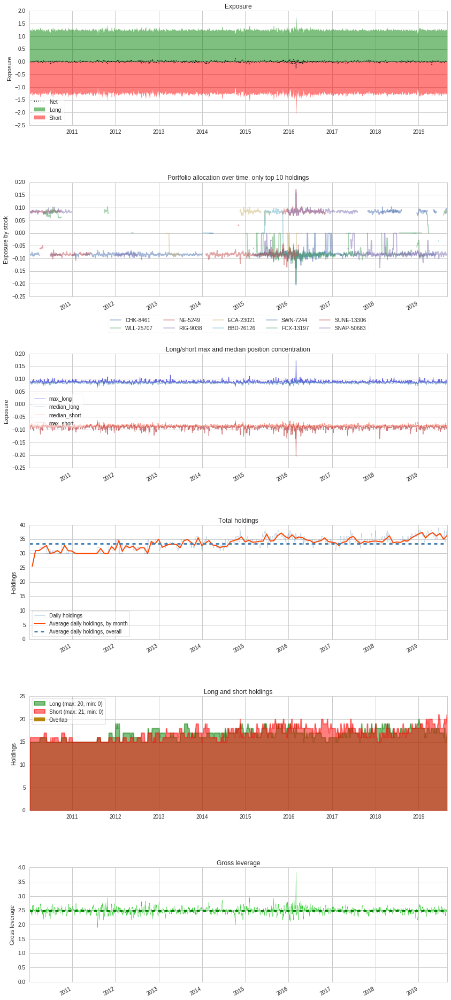

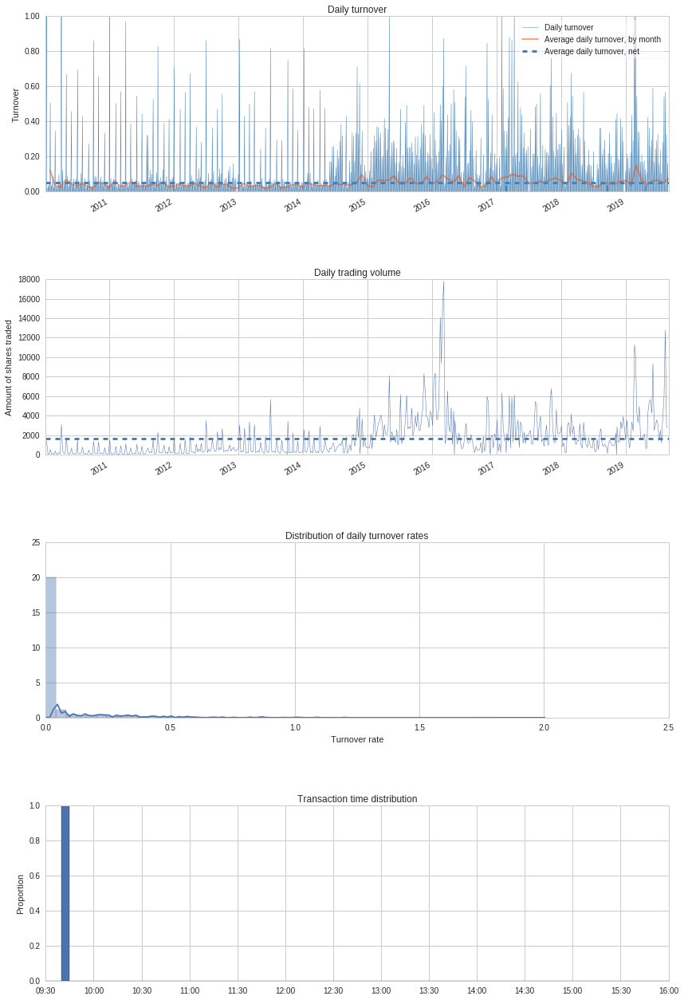

/usr/local/lib/python2.7/dist-packages/pyfolio/perf_attrib.py:559: UserWarning: Could not determine risk exposures for some of this algorithm's positions. Returns from the missing assets will not be properly accounted for in performance attribution.

 40 assets were missing factor loadings, including: AAMRQ-389, ALU-273, AMRN-21036, AMX-22416, ASML-12626..YOKU-40562. Ignoring for exposure calculation and performance attribution. Ratio of assets missing: 0.104. Average allocation of selected missing assets:

AAMRQ-389     -908.036847
ALU-273      -1068.637051
AMRN-21036   -2149.565211
AMX-22416     4994.515465
ASML-12626     901.314793
YOKU-40562    -614.253158
dtype: float64.

  warnings.warn(missing_stocks_warning_msg)


## Performance Relative to Common Risk Factors

Summary Statistics,
Annualized Specific Return,20.42%
Annualized Common Return,4.84%
Annualized Total Return,25.94%
Specific Sharpe Ratio,0.99


Exposures Summary,Average Risk Factor Exposure,Annualized Return,Cumulative Return
basic_materials,-0.03,0.09%,0.84%
consumer_cyclical,-0.01,-0.71%,-6.68%
financial_services,0.02,0.62%,6.15%
real_estate,-0.01,-0.02%,-0.24%
consumer_defensive,-0.01,-0.15%,-1.48%
health_care,-0.02,-0.44%,-4.20%
utilities,-0.00,0.04%,0.34%
communication_services,-0.01,-0.11%,-1.02%
energy,-0.12,-1.83%,-16.33%
industrials,-0.00,-0.06%,-0.53%


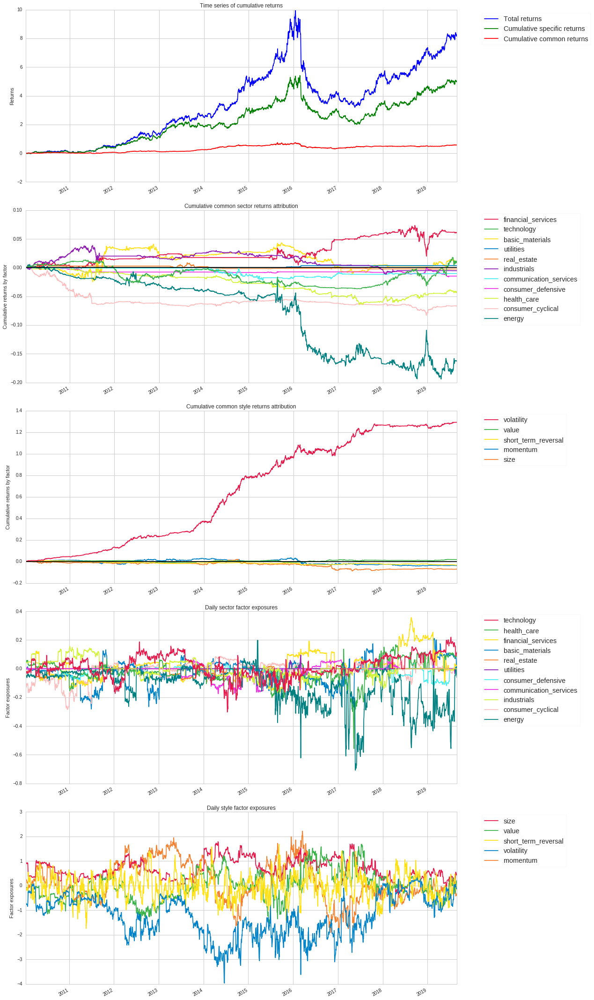

In [1]:
# My backtest Unique ID code
bt1 = get_backtest('5d6dc305a8285660d9884037')
# Create a tear sheet with visuals to help understand this model.
bt1.create_full_tear_sheet()

This model is good for long term investments because it preforms well over multiple phases off the market, while annualy increasing it's return. In 2016, my model lost preformance due to the market sell off around March and April. My model preformed too many high volume trades and suffered, however, overall my model is preforming postive and beating the market. 

This model should be used for investors who want to use some risk over 5+ years. 

# Best Model for Short Term Gains

This model is only good for short term gains, it did not preform well with historical data over a span of 9 years (Again, to see how will my model preforms during multiple market phases). 

In [2]:
import pyfolio as pf
import matplotlib.pyplot as plt
import empyrical  as ep


# This Uniqe ID is one of my backtest on a model that preformed really well with an attractive Sharpe Ratio.
bt = get_backtest('5d6c600df34a8a60961d3827')
returns = bt.daily_performance['returns']

100% Time:  0:00:00|##########################################################|


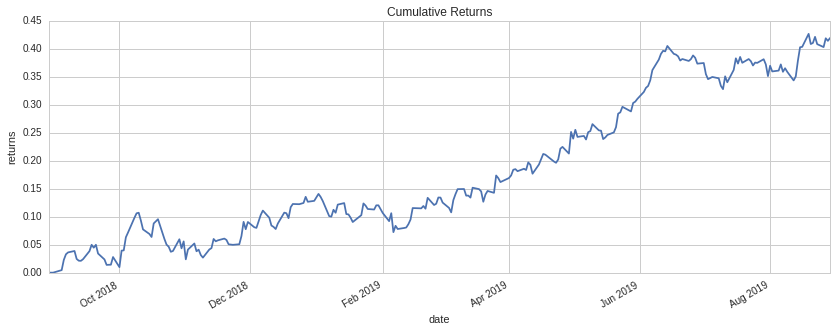

In [4]:
cum_returns = ep.cum_returns(returns)
ax = cum_returns.plot(figsize=(14,5))
ax.set(title='Cumulative Returns', ylabel='returns', xlabel='date');

In [5]:
benchmark_rets = pf.utils.get_symbol_rets('SPY')
pf.plotting.show_perf_stats(returns, benchmark_rets)

Start date,2018-08-29
End date,2019-08-29
Total months,12
,Backtest
Annual return,41.9%
Cumulative returns,41.9%
Annual volatility,16.5%
Sharpe ratio,2.21
Calmar ratio,5.57
Stability,0.91
Max drawdown,-7.5%


For this model, as you can see it has 41.9% return rate in just one year and beating the market growth rate by 37%. That's a very good model for a one year investment.

# Refrences

1. Intro and Getting Stock Price Data - Python Programming for Finance by SentDex(https://www.youtube.com/watch?v=2BrpKpWwT2A)


2. Quantopian Documentation (https://www.quantopian.com/help)


3. Finacial Fundamental Data (https://www.quantopian.com/docs/data-reference/morningstar_fundamentals)


4. Stock Data taken from Quantopian API 


5. Quantopian Tutoirals (https://www.quantopian.com/tutorials/getting-started)


6. Quantopian Lectures (https://www.quantopian.com/lectures)


7. Intro to Python & Finance (https://www.datacamp.com/courses/intro-to-python-for-finance)


8. Investopedia For Financial Defintions (http://investopedia.com)


9. Quantopian Community (https://www.quantopian.com/posts)